In [3]:
import mediapipe as mp
import cv2
import itertools
import numpy as np
from time import time
import matplotlib.pyplot as plt

In [2]:
!pip install mediapipe

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.7/35.7 MB 31.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 36.5 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-metadata 1.15.0 requires protobuf<4.21,>=3.20.3; python_version < "3.11", but you have protobuf 4.25.3 which is incompatible.


In [4]:
mp_face_detection = mp.solutions.face_detection
face_detection = mp_face_detection.FaceDetection(model_selection=0, min_detection_confidence=0.5)
mp_drawing = mp.solutions.drawing_utils

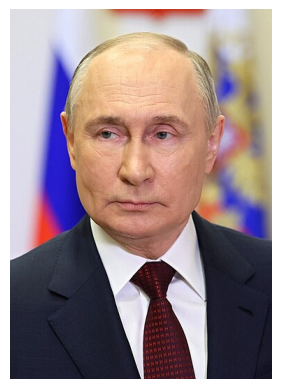

In [5]:
import cv2
import matplotlib.pyplot as plt
import requests
from io import BytesIO

# URL of the image
url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/f/f3/%D0%92%D0%BB%D0%B0%D0%B4%D0%B8%D0%BC%D0%B8%D1%80_%D0%9F%D1%83%D1%82%D0%B8%D0%BD_%2808-03-2024%29_%28cropped%29.jpg/375px-%D0%92%D0%BB%D0%B0%D0%B4%D0%B8%D0%BC%D0%B8%D1%80_%D0%9F%D1%83%D1%82%D0%B8%D0%BD_%2808-03-2024%29_%28cropped%29.jpg'

# Download the image from the URL
response = requests.get(url)
image = cv2.imdecode(np.frombuffer(response.content, np.uint8), cv2.IMREAD_COLOR)

# Convert BGR to RGB (OpenCV uses BGR by default, matplotlib expects RGB)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image using matplotlib
plt.imshow(image_rgb)
plt.axis('off')  # Hide axis labels
plt.show()


In [6]:
face_detection_results = face_detection.process(image[:, :, ::-1])

/usr/local/lib/python3.10/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


In [7]:
points = []
if face_detection_results.detections:

    for face_no, face in enumerate(face_detection_results.detections):
        print(f'FACE NUMBER: {face_no + 1}')
        print('-----------------------')
        print(f'FACE CONFIDENCE: {round(face.score[0], 2)}')

        face_data = face.location_data

        print(f'\nFACE BOUNDING BOX:\n{face_data.relative_bounding_box }')

        for i in range(6):
            print(f'{mp_face_detection.FaceKeyPoint(i).name}')
            print(f'{face_data.relative_keypoints[mp_face_detection.FaceKeyPoint(i).value]}')
            points.append(face_data.relative_keypoints[mp_face_detection.FaceKeyPoint(i).value])


FACE NUMBER: 1
-----------------------
FACE CONFIDENCE: 0.97

FACE BOUNDING BOX:
xmin: 0.229021773
ymin: 0.23295024
width: 0.554202378
height: 0.392083675

RIGHT_EYE
x: 0.366563797
y: 0.351925284

LEFT_EYE
x: 0.592151
y: 0.356413335

NOSE_TIP
x: 0.4582901
y: 0.462911427

MOUTH_CENTER
x: 0.464889288
y: 0.530880392

RIGHT_EAR_TRAGION
x: 0.273520648
y: 0.3648417

LEFT_EAR_TRAGION
x: 0.74558413
y: 0.374325961



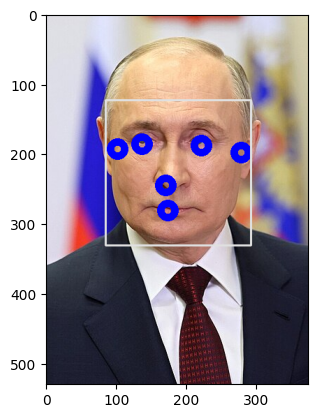

In [8]:
img_copy = image[:, :, ::-1].copy()
if face_detection_results.detections:

    for face_no, face in enumerate(face_detection_results.detections):
        mp_drawing.draw_detection(image=img_copy, detection=face,
                                  keypoint_drawing_spec=mp_drawing.DrawingSpec(color=(0, 0, 255), thickness=10, circle_radius=10))
plt.imshow(img_copy)

In [9]:
mp_face_mesh = mp.solutions.face_mesh
face_mesh_images = mp_face_mesh.FaceMesh(static_image_mode=False, max_num_faces=2, min_detection_confidence=0.5)
face_mesh_videos = mp_face_mesh.FaceMesh(static_image_mode=False, max_num_faces=2, min_detection_confidence=0.5,
                                         min_tracking_confidence=0.3)
mp_drawing_styles = mp.solutions.drawing_styles

In [10]:
face_mesh_results = face_mesh_images.process(image[:, :, ::-1])

LEFT_EYE_INDEXES = list(set(itertools.chain(*mp_face_mesh.FACEMESH_LEFT_EYE)))
RIGHT_EYE_INDEXES = list(set(itertools.chain(*mp_face_mesh.FACEMESH_RIGHT_EYE)))
LEFT_EYEBROW_INDEXES = list(set(itertools.chain(*mp_face_mesh.FACEMESH_LEFT_EYEBROW)))
RIGHT_EYEBROW_INDEXES = list(set(itertools.chain(*mp_face_mesh.FACEMESH_RIGHT_EYEBROW)))
LIPS_INDEXES = list(set(itertools.chain(*mp_face_mesh.FACEMESH_LIPS)))

if face_mesh_results.multi_face_landmarks:

    for face_no, face_landmarks in enumerate(face_mesh_results.multi_face_landmarks):
        print(f'FACE NUMBER: {face_no + 1}')
        print('-----------------------')

        print(f'LEFT EYE LANDMARKS:\n')
        for LEFT_EYE_INDEX in LEFT_EYE_INDEXES:
            print(face_landmarks.landmark[LEFT_EYE_INDEX])

        print(f'RIGHT EYE LANDMARKS:\n')
        for RIGHT_EYE_INDEX in RIGHT_EYE_INDEXES:
            print(face_landmarks.landmark[RIGHT_EYE_INDEX])

        print(f'LEFT EYEBROW LANDMARKS:\n')
        for LEFT_EYEBROW_INDEX in LEFT_EYEBROW_INDEXES:
            print(face_landmarks.landmark[LEFT_EYEBROW_INDEX])

        print(f'RIGHT EYEBROW LANDMARKS:\n')
        for RIGHT_EYEBROW_INDEX in RIGHT_EYEBROW_INDEXES:
            print(face_landmarks.landmark[RIGHT_EYEBROW_INDEX])

        print(f'LIPS LANDMARKS:\n')
        for LIPS_INDEX in LIPS_INDEXES:
            print(face_landmarks.landmark[LIPS_INDEX])

FACE NUMBER: 1
-----------------------
LEFT EYE LANDMARKS:

x: 0.558201492
y: 0.33495
z: -0.0127646597

x: 0.577752709
y: 0.329342455
z: -0.0177812688

x: 0.597156167
y: 0.328671277
z: -0.0179573372

x: 0.61614275
y: 0.331820756
z: -0.0136178518

x: 0.627577543
y: 0.336474955
z: -0.00653000362

x: 0.621161461
y: 0.349358916
z: -0.000246367097

x: 0.639183521
y: 0.342320889
z: 0.00995829701

x: 0.538547397
y: 0.34866786
z: -0.00271104835

x: 0.544491947
y: 0.343360841
z: -0.00731770508

x: 0.634136677
y: 0.339825928
z: 0.000553587044

x: 0.607824624
y: 0.351991
z: -0.00581588829

x: 0.588980436
y: 0.353658
z: -0.00989672542

x: 0.630651355
y: 0.346425354
z: 0.00452438416

x: 0.570815086
y: 0.352870107
z: -0.0102309184

x: 0.553509176
y: 0.350685984
z: -0.00707155839

x: 0.543054283
y: 0.349771023
z: -0.00307168509

RIGHT EYE LANDMARKS:

x: 0.348830163
y: 0.330705225
z: 0.000994794536

x: 0.328358114
y: 0.341153651
z: 0.0267282017

x: 0.338117033
y: 0.335340202
z: 0.00905621797

x: 0.344

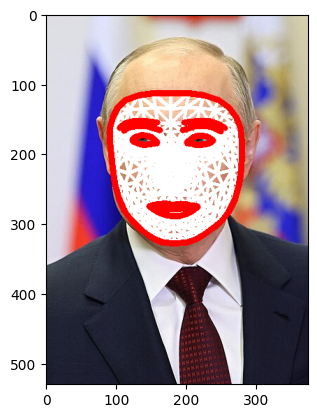

In [11]:
image_copy = image[:, :, ::-1].copy()
if face_detection_results.detections:

    for face_landmarks in face_mesh_results.multi_face_landmarks:
        mp_drawing.draw_landmarks(image=image_copy,
                                  landmark_list=face_landmarks,
                                  connections=mp_face_mesh.FACEMESH_TESSELATION,
                                  landmark_drawing_spec=None,
                                  connection_drawing_spec=mp_drawing.DrawingSpec(color=(255, 255, 255), thickness=3))
        mp_drawing.draw_landmarks(image=image_copy,
                                  landmark_list=face_landmarks,
                                  connections=mp_face_mesh.FACEMESH_CONTOURS,
                                  landmark_drawing_spec=None,
                                  connection_drawing_spec=mp_drawing.DrawingSpec(color=(255, 0, 0), thickness=7))

plt.imshow(image_copy)

In [22]:
def detectFacialLandmarks(image, face_mesh_images, display=True):
    image_copy = image[:, :, ::-1].copy()
    image_mesh = image[:, :, ::-1].copy()

    face_mesh_results = face_mesh_images.process(image_mesh[:, :, ::-1])

    LEFT_EYE_INDEXES = list(set(itertools.chain(*mp_face_mesh.FACEMESH_LEFT_EYE)))
    RIGHT_EYE_INDEXES = list(set(itertools.chain(*mp_face_mesh.FACEMESH_RIGHT_EYE)))
    LEFT_EYEBROW_INDEXES = list(set(itertools.chain(*mp_face_mesh.FACEMESH_LEFT_EYEBROW)))
    RIGHT_EYEBROW_INDEXES = list(set(itertools.chain(*mp_face_mesh.FACEMESH_RIGHT_EYEBROW)))
    LIPS_INDEXES = list(set(itertools.chain(*mp_face_mesh.FACEMESH_LIPS)))

    if face_mesh_results.multi_face_landmarks:
        for face_landmarks in face_mesh_results.multi_face_landmarks:
                    mp_drawing.draw_landmarks(image=image_mesh,
                                    landmark_list=face_landmarks,
                                    connections=mp_face_mesh.FACEMESH_TESSELATION,
                                    landmark_drawing_spec=None,
                                    connection_drawing_spec=mp_drawing.DrawingSpec(color=(255, 255, 255), thickness=1))
                    mp_drawing.draw_landmarks(image=image_mesh,
                                    landmark_list=face_landmarks,
                                    connections=mp_face_mesh.FACEMESH_CONTOURS,
                                    landmark_drawing_spec=None,
                                    connection_drawing_spec=mp_drawing.DrawingSpec(color=(255, 0, 0), thickness=3))


    if display:
        fig, ax = plt.subplots(1, 2)

        ax[0].set_title('Original Image')
        ax[0].imshow(image_copy)
        ax[1].set_title('Output')
        ax[1].imshow(image_mesh)

    else:
        if face_mesh_results.multi_face_landmarks:
            for face_no, face_landmarks in enumerate(face_mesh_results.multi_face_landmarks):
                print(f'FACE NUMBER: {face_no + 1}')
                print('-----------------------')

                print(f'LEFT EYE LANDMARKS:\n')
                for LEFT_EYE_INDEX in LEFT_EYE_INDEXES:
                    print(face_landmarks.landmark[LEFT_EYE_INDEX])

                print(f'RIGHT EYE LANDMARKS:\n')
                for RIGHT_EYE_INDEX in RIGHT_EYE_INDEXES:
                    print(face_landmarks.landmark[RIGHT_EYE_INDEX])

                print(f'LEFT EYEBROW LANDMARKS:\n')
                for LEFT_EYEBROW_INDEX in LEFT_EYEBROW_INDEXES:
                    print(face_landmarks.landmark[LEFT_EYEBROW_INDEX])

                print(f'RIGHT EYEBROW LANDMARKS:\n')
                for RIGHT_EYEBROW_INDEX in RIGHT_EYEBROW_INDEXES:
                    print(face_landmarks.landmark[RIGHT_EYEBROW_INDEX])

                print(f'LIPS LANDMARKS:\n')
                for LIPS_INDEX in LIPS_INDEXES:
                    print(face_landmarks.landmark[LIPS_INDEX])

    return np.ascontiguousarray(image_mesh[:,:,::-1], dtype=np.uint8), face_mesh_results

/usr/local/lib/python3.10/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


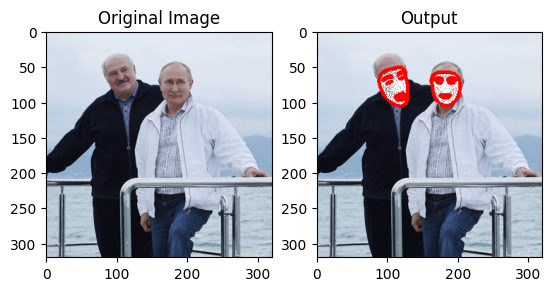

In [24]:
# URL of the image
url='https://icdn.lenta.ru/images/2021/05/29/21/20210529212247325/square_320_26c46fffce43fbb9cbc4ebf7eaf6a0b4.jpg'
# Download the image from the URL
response = requests.get(url)
image = cv2.imdecode(np.frombuffer(response.content, np.uint8), cv2.IMREAD_COLOR)
_, _ = detectFacialLandmarks(image, face_mesh_images, display=True)

In [1]:
camera_video = cv2.VideoCapture(0)
camera_video.set(3, 1200)
camera_video.set(4, 960)

cv2.namedWindow("Face Landmarks Detection", cv2.WINDOW_NORMAL)
time1 = 0

while camera_video.isOpened():
    ok, frame = camera_video.read()

    if not ok:
        continue

    frame = cv2.flip(frame, 1)

    frame, _ = detectFacialLandmarks(frame, face_mesh_videos, display=False)
    time2 = time()

    if (time2 - time1) > 0:
        frames_per_second = 1.0 / (time2 - time1)
        cv2.putText(frame, 'FPS: {}'.format(int(frames_per_second)), (10, 30),
            cv2.FONT_HERSHEY_PLAIN, 2, (0, 255, 0), 3)

    time1 = time2
    cv2.imshow('Face Landmarks Detection', frame)
    k = cv2.waitKey(1)
    if (k == 27):
        break

camera_video.release()
cv2.destroyAllWindows()

NameError: name 'cv2' is not defined

In [ ]:
def isOpen(image, face_mesh_results, face_part, threshold=5, display=True):
    '''
    This function checks whether the an eye or mouth of the person(s) is open,
    utilizing its facial landmarks.
    Args:
        image:             The image of person(s) whose an eye or mouth is to be checked.
        face_mesh_results: The output of the facial landmarks detection on the image.
        face_part:         The name of the face part that is required to check.
        threshold:         The threshold value used to check the isOpen condition.
        display:           A boolean value that is if set to true the function displays
                           the output image and returns nothing.
    Returns:
        output_image: The image of the person with the face part is opened  or not status written.
        status:       A dictionary containing isOpen statuses of the face part of all the
                      detected faces.
    '''

    # Retrieve the height and width of the image.
    image_height, image_width, _ = image.shape

    # Create a copy of the input image to write the isOpen status.
    output_image = image.copy()

    # Create a dictionary to store the isOpen status of the face part of all the detected faces.
    status={}

    # Check if the face part is mouth.
    if face_part == 'MOUTH':

        # Get the indexes of the mouth.
        INDEXES = mp_face_mesh.FACEMESH_LIPS

        # Specify the location to write the is mouth open status.
        loc = (10, image_height - image_height//40)

        # Initialize a increment that will be added to the status writing location,
        # so that the statuses of two faces donot overlap.
        increment=-30

    # Check if the face part is left eye.
    elif face_part == 'LEFT EYE':

        # Get the indexes of the left eye.
        INDEXES = mp_face_mesh.FACEMESH_LEFT_EYE

        # Specify the location to write the is left eye open status.
        loc = (10, 30)

        # Initialize a increment that will be added to the status writing location,
        # so that the statuses of two faces donot overlap.
        increment=30

    # Check if the face part is right eye.
    elif face_part == 'RIGHT EYE':

        # Get the indexes of the right eye.
        INDEXES = mp_face_mesh.FACEMESH_RIGHT_EYE

        # Specify the location to write the is right eye open status.
        loc = (image_width-300, 30)

        # Initialize a increment that will be added to the status writing location,
        # so that the statuses of two faces donot overlap.
        increment=30

    # Otherwise return nothing.
    else:
        return

    # Iterate over the found faces.
    for face_no, face_landmarks in enumerate(face_mesh_results.multi_face_landmarks):

         # Get the height of the face part.
        _, height, _ = getSize(image, face_landmarks, INDEXES)

         # Get the height of the whole face.
        _, face_height, _ = getSize(image, face_landmarks, mp_face_mesh.FACEMESH_FACE_OVAL)

        # Check if the face part is open.
        if (height/face_height)*100 > threshold:

            # Set status of the face part to open.
            status[face_no] = 'OPEN'

            # Set color which will be used to write the status to green.
            color=(0,255,0)

        # Otherwise.
        else:
            # Set status of the face part to close.
            status[face_no] = 'CLOSE'

            # Set color which will be used to write the status to red.
            color=(0,0,255)

        # Write the face part isOpen status on the output image at the appropriate location.
        cv2.putText(output_image, f'FACE {face_no+1} {face_part} {status[face_no]}.',
                    (loc[0],loc[1]+(face_no*increment)), cv2.FONT_HERSHEY_PLAIN, 1.4, color, 2)

    # Check if the output image is specified to be displayed.
    if display:

        # Display the output image.
        plt.figure(figsize=[10,10])
        plt.imshow(output_image[:,:,::-1]);plt.title("Output Image");plt.axis('off');

    # Otherwise
    else:

        # Return the output image and the isOpen statuses of the face part of each detected face.
        return output_image, status

In [ ]:
def getSize(image, face_landmarks, INDEXES):
    '''
    This function calculate the height and width of a face part utilizing its landmarks.
    Args:
        image:          The image of person(s) whose face part size is to be calculated.
        face_landmarks: The detected face landmarks of the person whose face part size is to
                        be calculated.
        INDEXES:        The indexes of the face part landmarks, whose size is to be calculated.
    Returns:
        width:     The calculated width of the face part of the face whose landmarks were passed.
        height:    The calculated height of the face part of the face whose landmarks were passed.
        landmarks: An array of landmarks of the face part whose size is calculated.
    '''

    # Retrieve the height and width of the image.
    image_height, image_width, _ = image.shape

    # Convert the indexes of the landmarks of the face part into a list.
    INDEXES_LIST = list(itertools.chain(*INDEXES))

    # Initialize a list to store the landmarks of the face part.
    landmarks = []

    # Iterate over the indexes of the landmarks of the face part.
    for INDEX in INDEXES_LIST:

        # Append the landmark into the list.
        landmarks.append([int(face_landmarks.landmark[INDEX].x * image_width),
                               int(face_landmarks.landmark[INDEX].y * image_height)])

    # Calculate the width and height of the face part.
    _, _, width, height = cv2.boundingRect(np.array(landmarks))

    # Convert the list of landmarks of the face part into a numpy array.
    landmarks = np.array(landmarks)

    # Retrurn the calculated width height and the landmarks of the face part.
    return width, height, landmarks

In [ ]:
def overlay(image, filter_img, face_landmarks, face_part, INDEXES, display=True):
    '''
    This function will overlay a filter image over a face part of a person in the image/frame.
    Args:
        image:          The image of a person on which the filter image will be overlayed.
        filter_img:     The filter image that is needed to be overlayed on the image of the person.
        face_landmarks: The facial landmarks of the person in the image.
        face_part:      The name of the face part on which the filter image will be overlayed.
        INDEXES:        The indexes of landmarks of the face part.
        display:        A boolean value that is if set to true the function displays
                        the annotated image and returns nothing.
    Returns:
        annotated_image: The image with the overlayed filter on the top of the specified face part.
    '''

    # Create a copy of the image to overlay filter image on.
    annotated_image = image.copy()

    # Errors can come when it resizes the filter image to a too small or a too large size .
    # So use a try block to avoid application crashing.
    try:

        # Get the width and height of filter image.
        filter_img_height, filter_img_width, _  = filter_img.shape

        # Get the height of the face part on which we will overlay the filter image.
        _, face_part_height, landmarks = getSize(image, face_landmarks, INDEXES)

        # Specify the height to which the filter image is required to be resized.
        required_height = int(face_part_height*2.5)

        # Resize the filter image to the required height, while keeping the aspect ratio constant.
        resized_filter_img = cv2.resize(filter_img, (int(filter_img_width*
                                                         (required_height/filter_img_height)),
                                                     required_height))

        # Get the new width and height of filter image.
        filter_img_height, filter_img_width, _  = resized_filter_img.shape

        # Convert the image to grayscale and apply the threshold to get the mask image.
        _, filter_img_mask = cv2.threshold(cv2.cvtColor(resized_filter_img, cv2.COLOR_BGR2GRAY),
                                           25, 255, cv2.THRESH_BINARY_INV)

        # Calculate the center of the face part.
        center = landmarks.mean(axis=0).astype("int")

        # Check if the face part is mouth.
        if face_part == 'MOUTH':

            # Calculate the location where the smoke filter will be placed.
            location = (int(center[0] - filter_img_width / 3), int(center[1]))

        # Otherwise if the face part is an eye.
        else:

            # Calculate the location where the eye filter image will be placed.
            location = (int(center[0]-filter_img_width/2), int(center[1]-filter_img_height/2))

        # Retrieve the region of interest from the image where the filter image will be placed.
        ROI = image[location[1]: location[1] + filter_img_height,
                    location[0]: location[0] + filter_img_width]

        # Perform Bitwise-AND operation. This will set the pixel values of the region where,
        # filter image will be placed to zero.
        resultant_image = cv2.bitwise_and(ROI, ROI, mask=filter_img_mask)

        # Add the resultant image and the resized filter image.
        # This will update the pixel values of the resultant image at the indexes where
        # pixel values are zero, to the pixel values of the filter image.
        resultant_image = cv2.add(resultant_image, resized_filter_img)

        # Update the image's region of interest with resultant image.
        annotated_image[location[1]: location[1] + filter_img_height,
                        location[0]: location[0] + filter_img_width] = resultant_image

    # Catch and handle the error(s).
    except Exception as e:
        pass

    # Check if the annotated image is specified to be displayed.
    if display:

        # Display the annotated image.
        plt.figure(figsize=[10,10])
        plt.imshow(annotated_image[:,:,::-1]);plt.title("Output Image");plt.axis('off');

    # Otherwise
    else:

        # Return the annotated image.
        return annotated_image

In [ ]:
camera_video = cv2.VideoCapture(0)
camera_video.set(3,1280)
camera_video.set(4,960)

# Create named window for resizing purposes.
cv2.namedWindow('Face Filter', cv2.WINDOW_NORMAL)

# Read the left and right eyes images.
left_eye = cv2.imread('left_eye.png')
right_eye = cv2.imread('right_eye.png')

# Initialize the VideoCapture object to read from the smoke animation video stored in the disk.
smoke_animation = cv2.VideoCapture('smoke_animation.mp4')

# Set the smoke animation video frame counter to zero.
smoke_frame_counter = 0

# Iterate until the webcam is accessed successfully.
while camera_video.isOpened():

    # Read a frame.
    ok, frame = camera_video.read()

    # Check if frame is not read properly then continue to the next iteration to read
    # the next frame.
    if not ok:
        continue

    # Read a frame from smoke animation video
    _, smoke_frame = smoke_animation.read()

    # Increment the smoke animation video frame counter.
    smoke_frame_counter += 1

    # Check if the current frame is the last frame of the smoke animation video.
    if smoke_frame_counter == smoke_animation.get(cv2.CAP_PROP_FRAME_COUNT):

        # Set the current frame position to first frame to restart the video.
        smoke_animation.set(cv2.CAP_PROP_POS_FRAMES, 0)

        # Set the smoke animation video frame counter to zero.
        smoke_frame_counter = 0

    # Flip the frame horizontally for natural (selfie-view) visualization.
    frame = cv2.flip(frame, 1)

    # Perform Face landmarks detection.
    _, face_mesh_results = detectFacialLandmarks(frame, face_mesh_videos, display=False)

    # Check if facial landmarks are found.
    if face_mesh_results.multi_face_landmarks:

        # Get the mouth isOpen status of the person in the frame.
        _, mouth_status = isOpen(frame, face_mesh_results, 'MOUTH',
                                     threshold=15, display=False)

        # Get the left eye isOpen status of the person in the frame.
        _, left_eye_status = isOpen(frame, face_mesh_results, 'LEFT EYE',
                                        threshold=4.5 , display=False)

        # Get the right eye isOpen status of the person in the frame.
        _, right_eye_status = isOpen(frame, face_mesh_results, 'RIGHT EYE',
                                         threshold=4.5, display=False)

        # Iterate over the found faces.
        for face_num, face_landmarks in enumerate(face_mesh_results.multi_face_landmarks):

            # Check if the left eye of the face is open.
            if left_eye_status[face_num] == 'OPEN':

                # Overlay the left eye image on the frame at the appropriate location.
                frame = overlay(frame, left_eye, face_landmarks,
                                'LEFT EYE', mp_face_mesh.FACEMESH_LEFT_EYE, display=False)

            # Check if the right eye of the face is open.
            if right_eye_status[face_num] == 'OPEN':

                # Overlay the right eye image on the frame at the appropriate location.
                frame = overlay(frame, right_eye, face_landmarks,
                                'RIGHT EYE', mp_face_mesh.FACEMESH_RIGHT_EYE, display=False)

            # Check if the mouth of the face is open.
            if mouth_status[face_num] == 'OPEN':

                # Overlay the smoke animation on the frame at the appropriate location.
                frame = overlay(frame, smoke_frame, face_landmarks,
                                'MOUTH', mp_face_mesh.FACEMESH_LIPS, display=False)

    # Display the frame.
    cv2.imshow('Face Filter', frame)

    # Wait for 1ms. If a key is pressed, retreive the ASCII code of the key.
    k = cv2.waitKey(1) & 0xFF

    # Check if 'ESC' is pressed and break the loop.
    if(k == 27):
        break

# Release the VideoCapture Object and close the windows.
camera_video.release()
cv2.destroyAllWindows()

FACE NUMBER: 1
-----------------------
LEFT EYE LANDMARKS:

x: 0.492922842502594
y: 0.5416287183761597
z: -0.004792592488229275

x: 0.49913737177848816
y: 0.5388248562812805
z: -0.006655568722635508

x: 0.5052896738052368
y: 0.5394207835197449
z: -0.007279298733919859

x: 0.5113452076911926
y: 0.5430546402931213
z: -0.006691231857985258

x: 0.5149247646331787
y: 0.5474078059196472
z: -0.005140108522027731

x: 0.5122122764587402
y: 0.5582225322723389
z: -0.0038163792341947556

x: 0.5187808871269226
y: 0.553404688835144
z: -0.0011166196782141924

x: 0.4864312708377838
y: 0.5494686365127563
z: -0.0014946424635127187

x: 0.48845842480659485
y: 0.5463564991950989
z: -0.002945273881778121

x: 0.5170480012893677
y: 0.5506492853164673
z: -0.003441394306719303

x: 0.5077089667320251
y: 0.5594227313995361
z: -0.005081793759018183

x: 0.501363217830658
y: 0.5587770342826843
z: -0.005727154668420553

x: 0.5156430006027222
y: 0.5563451051712036
z: -0.0026135393418371677

x: 0.4957639276981354
y: 0.